# Task 3 - Exploratory Data Analysis (Retail)
## Submitted by : Shivam Sunil Bhosale
### Perform ‘Exploratory Data Analysis’ on dataset ‘SampleSuperstore’

In [4]:
import pandas as pd
import numpy as numpy
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv('SampleSuperstore.csv')

In [6]:
df.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


In [7]:
df.describe()

,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,55190.379428,229.858001,3.789574,0.156203,28.656896
std,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,90008.000000,209.940000,5.000000,0.200000,29.364000
max,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


In [10]:
df.shape

(9994, 13)

### Cleaning the Data

In [11]:
df = df.drop(["Country"], axis=1)

In [12]:
pd.DataFrame(df.isnull().sum(),columns=['Number of missing values'])

,Number of missing values
Ship Mode,0
Segment,0
City,0
State,0
Postal Code,0
Region,0
Category,0
Sub-Category,0
Sales,0
Quantity,0


In [14]:
df.duplicated()
df.head(5)

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


In [15]:
df.duplicated().sum()

17

In [16]:
df.nunique()

Ship Mode          4
Segment            3
City             531
State             49
Postal Code      631
Region             4
Category           3
Sub-Category      17
Sales           5825
Quantity          14
Discount          12
Profit          7287
dtype: int64

In [17]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [18]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [19]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [20]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [22]:
data = df.drop_duplicates(keep='first')

In [23]:
df2 = df.sort_values(by='Sales',ascending=False)

In [24]:
df2.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.480,6,0.5,-1811.0784
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.950,5,0.0,8399.9760
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.960,4,0.0,6719.9808
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.968,4,0.2,3919.9888
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.970,3,0.0,5039.9856


In [25]:
df2.shape

(9994, 12)

<AxesSubplot:xlabel='Region', ylabel='Sales'>

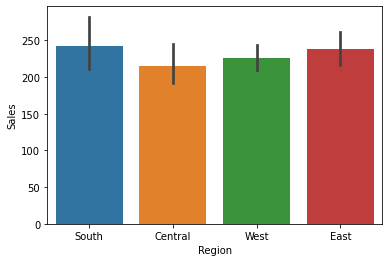

In [26]:
sns.barplot(x="Region",y="Sales",data=df2)

In [28]:
df2['z-score'] = (df2.Sales-df2.Sales.mean())/df2.Sales.std()

In [29]:
df2.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.480,6,0.5,-1811.0784,35.954750
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.950,5,0.0,8399.9760,27.709952
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.960,4,0.0,6719.9808,22.094200
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.968,4,0.2,3919.9888,17.601598
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.970,3,0.0,5039.9856,16.478448


In [31]:
df2[df2['z-score']>3]
df2.head(5)

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
2697,Standard Class,Home Office,Jacksonville,Florida,32216,South,Technology,Machines,22638.480,6,0.5,-1811.0784,35.954750
6826,Standard Class,Corporate,Lafayette,Indiana,47905,Central,Technology,Copiers,17499.950,5,0.0,8399.9760,27.709952
8153,First Class,Consumer,Seattle,Washington,98115,West,Technology,Copiers,13999.960,4,0.0,6719.9808,22.094200
2623,First Class,Home Office,New York City,New York,10024,East,Technology,Copiers,11199.968,4,0.2,3919.9888,17.601598
4190,Standard Class,Consumer,Newark,Delaware,19711,East,Technology,Copiers,10499.970,3,0.0,5039.9856,16.478448


In [32]:
df2[df2['z-score']<-3]

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score


### Removing Outlines from the dataset

In [33]:
df_no_outliers = df2[df2['z-score']<3]

In [34]:
df_no_outliers.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,z-score
6467,Standard Class,Home Office,Providence,Rhode Island,2908,East,Office Supplies,Storage,2079.400,5,0.0,582.2320,2.967600
949,Standard Class,Home Office,Philadelphia,Pennsylvania,19120,East,Furniture,Tables,2065.320,12,0.4,-619.5960,2.945008
3628,Standard Class,Consumer,Seattle,Washington,98103,West,Office Supplies,Binders,2060.744,7,0.2,643.9825,2.937666
3043,Same Day,Home Office,Long Beach,California,90805,West,Furniture,Chairs,2054.272,8,0.2,256.7840,2.927282
8168,Standard Class,Home Office,Seattle,Washington,98105,West,Furniture,Tables,2036.860,7,0.0,366.6348,2.899344


In [36]:
new_df = df_no_outliers

In [37]:
new_df.shape

(9867, 13)

### Scatter Plot Before Removing Outliers

<AxesSubplot:xlabel='Region', ylabel='Sales'>

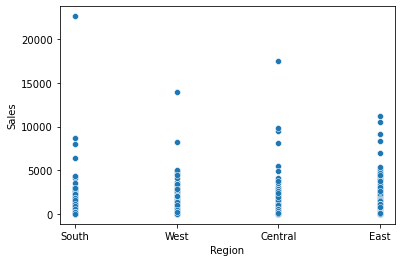

In [38]:
sns.scatterplot(x="Region",y="Sales",data=df)

### Distribution Plots

/Users/shivambhosale/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Sales', ylabel='Density'>

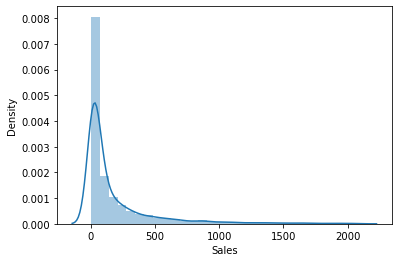

In [41]:
sns.distplot(new_df['Sales'],bins=30)

/Users/shivambhosale/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Discount', ylabel='Density'>

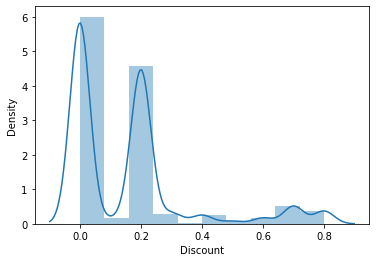

In [42]:
sns.distplot(new_df['Discount'],bins=10)

/Users/shivambhosale/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Profit', ylabel='Density'>

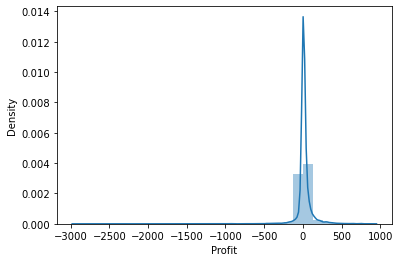

In [43]:
sns.distplot(new_df['Profit'],bins=30)

## Normal Distribtution

In [44]:
new_df = new_df.drop(['z-score','Postal Code'],axis=1)

In [45]:
new_df.corr()

,Sales,Quantity,Discount,Profit
Sales,1.000000,0.255552,-0.041876,0.271660
Quantity,0.255552,1.000000,0.010904,0.076426
Discount,-0.041876,0.010904,1.000000,-0.355820
Profit,0.271660,0.076426,-0.355820,1.000000


<AxesSubplot:>

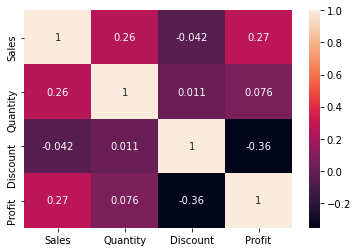

In [46]:
sns.heatmap(new_df.corr(),annot=True)

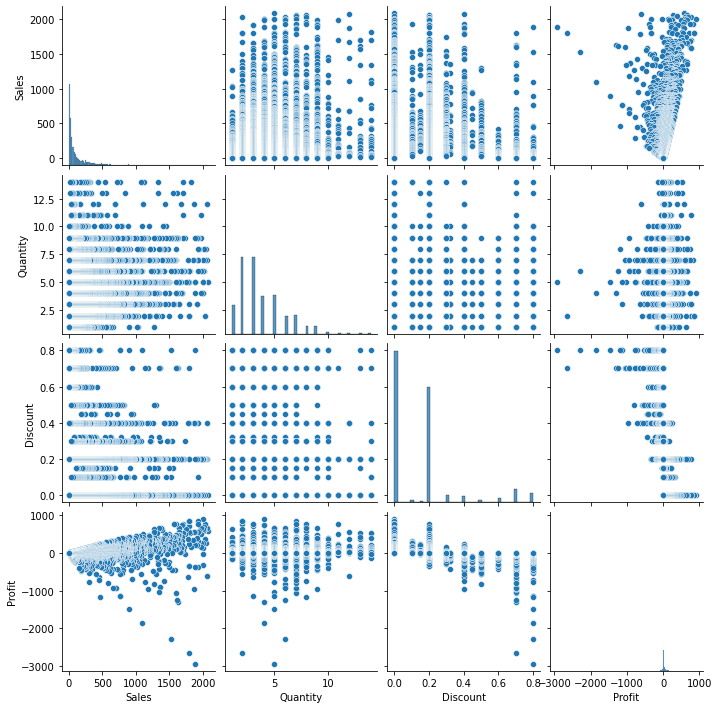

In [57]:
sns.pairplot(new_df)

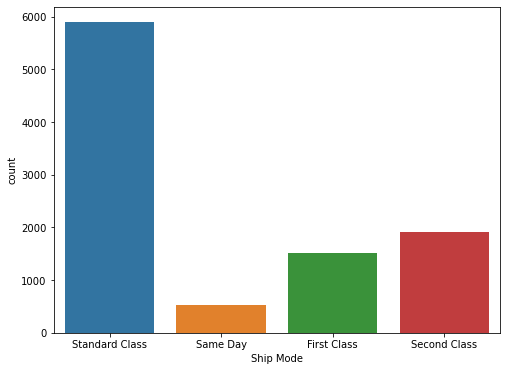

In [55]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["Ship Mode"])
plt.show()

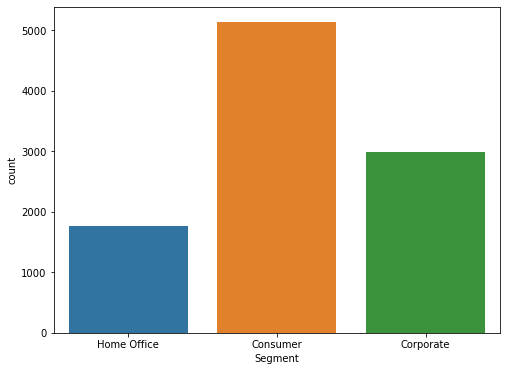

In [59]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["Segment"])
plt.show()

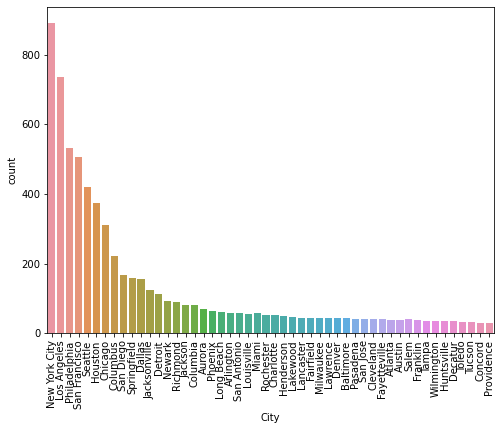

In [61]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["City"],order=(data['City'].value_counts().head(50)).index)
plt.xticks(rotation = 90)
plt.show()

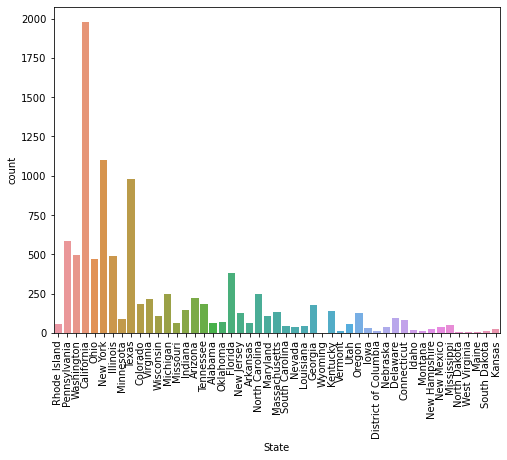

In [62]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["State"])
plt.xticks(rotation = 90)
plt.show()

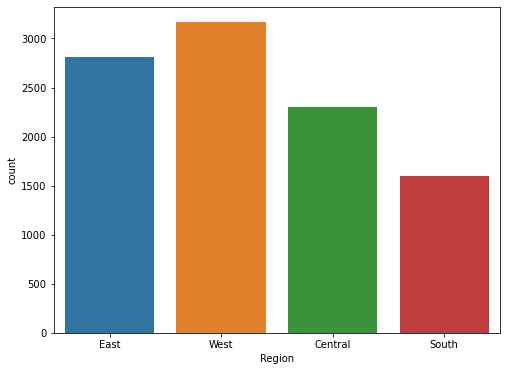

In [63]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["Region"])
plt.show()

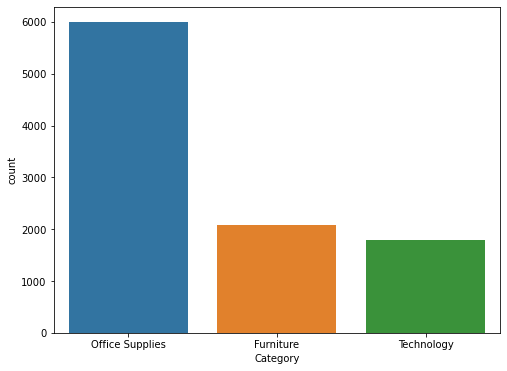

In [65]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["Category"])
plt.show()

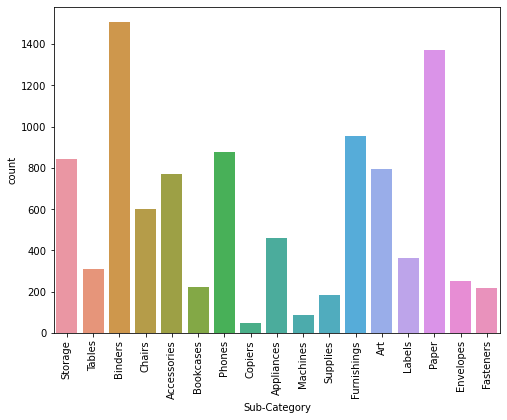

In [68]:
plt.figure(figsize=(8,6))
sns.countplot(x=new_df["Sub-Category"])
plt.xticks(rotation = 90)
plt.show()

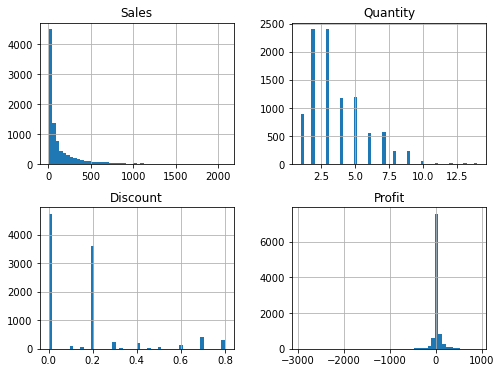

In [70]:
new_df.hist(bins=50,figsize=(8,6))
plt.show()

### Profitable Cities

In [71]:
df_top_10_cities = new_df.groupby("City")["Profit"].sum().reset_index().sort_values(by="Profit",ascending=False)
df_top_10_cities.head(10)

,City,Profit
329,New York City,34897.5783
266,Los Angeles,24592.5499
452,Seattle,17581.2251
438,San Francisco,15678.3905
123,Detroit,6854.4448
94,Columbus,5132.7195
437,San Diego,4969.8885
407,Richmond,4872.7471
215,Jackson,4688.6484
93,Columbia,4335.1267


In [72]:
df_top_10_cities = new_df.groupby("City")["Discount"].sum().reset_index().sort_values(by="Discount",ascending=False)
df_top_10_cities.head(10)

,City,Discount
374,Philadelphia,174.10
207,Houston,141.82
80,Chicago,120.10
109,Dallas,56.30
266,Los Angeles,53.15
329,New York City,49.70
94,Columbus,38.50
216,Jacksonville,35.15
438,San Francisco,33.60
452,Seattle,27.00


## Top 10 Profitable Sub-Categories.

In [73]:
df_top_10_sub_categories = new_df.groupby("Sub-Category")["Profit"].sum().reset_index().sort_values(by="Profit",ascending=False)
df_top_10_sub_categories.head(10)

,Sub-Category,Profit
0,Accessories,39503.4923
13,Phones,37886.6451
12,Paper,34053.5693
5,Chairs,21989.2644
14,Storage,19864.5829
1,Appliances,14633.8139
6,Copiers,13974.6680
9,Furnishings,13059.1436
7,Envelopes,6964.1767
2,Art,6527.7870


In [74]:
df_top_10_sub_categories = new_df.groupby("Sub-Category")["Discount"].sum().reset_index().sort_values(by="Discount",ascending=False)
df_top_10_sub_categories.head(10)

,Sub-Category,Discount
3,Binders,564.40
13,Phones,136.20
9,Furnishings,132.40
5,Chairs,103.10
12,Paper,102.60
16,Tables,82.15
1,Appliances,77.60
14,Storage,63.20
0,Accessories,60.80
2,Art,59.60


## Top 2 sales Region

In [75]:
df_top_10_region = new_df.groupby("Region")["Sales"].sum().reset_index().sort_values(by="Sales",ascending=False)
df_top_10_region.head(2)

,Region,Sales
3,West,592610.3555
1,East,506698.1940


## Analysis Completed

